# Problem Understanding

Customer churn prediction: Telecom Churn Dataset
Customer churn, also known as customer retention, customer turnover, or customer defection, is the loss of clients or customers.

Telephone service companies, Internet service providers, pay TV companies, insurance firms, and alarm monitoring services, often use customer attrition analysis and customer attrition rates as one of their key business metrics because the cost of retaining an existing customer is far less than acquiring a new one. Companies from these sectors often have customer service branches which attempt to win back defecting clients, because recovered long-term customers can be worth much more to a company than newly recruited clients.

Companies usually make a distinction between voluntary churn and involuntary churn. Voluntary churn occurs due to a decision by the customer to switch to another company or service provider, involuntary churn occurs due to circumstances such as a customer's relocation to a long-term care facility, death, or the relocation to a distant location. In most applications, involuntary reasons for churn are excluded from the analytical models. Analysts tend to concentrate on voluntary churn, because it typically occurs due to factors of the company-customer relationship which companies control, such as how billing interactions are handled or how after-sales help is provided.

Objective:
The objective of this problem is to create prediction model that predicts customer churn by assessing their propensity of risk to churn. Since these models generate a small prioritized list of potential defectors, they are effective at focusing customer retention marketing programs on the subset of the customer base who are most vulnerable to churn.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

In [2]:
df=pd.read_csv("customer_churn.csv")
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [4]:
df.shape

(2666, 20)

In [5]:
df["Churn"].value_counts()

False    2278
True      388
Name: Churn, dtype: int64

In [6]:
df["State"].unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'WV', 'RI', 'IA', 'MT',
       'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'NE', 'WY', 'IL', 'NH',
       'LA', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR', 'DE', 'IN', 'UT', 'CA',
       'SD', 'NC', 'WA', 'MN', 'NM', 'NV', 'DC', 'NY', 'KY', 'ME', 'MS',
       'MI', 'SC', 'TN', 'PA', 'HI', 'ND', 'CT'], dtype=object)

In [7]:
df["International plan"].unique()

array(['No', 'Yes'], dtype=object)

In [8]:
df["Voice mail plan"].unique()

array(['Yes', 'No'], dtype=object)

In [9]:
df["Churn"].unique()

array([False,  True])

# EDA

In [10]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [11]:
df.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

<AxesSubplot:xlabel='Account length', ylabel='Total day calls'>

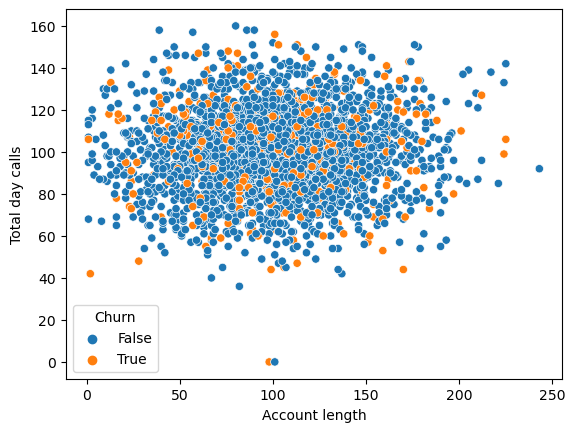

In [12]:
sns.scatterplot(x="Account length",y="Total day calls",hue="Churn",data=df)

<AxesSubplot:xlabel='Number vmail messages', ylabel='Customer service calls'>

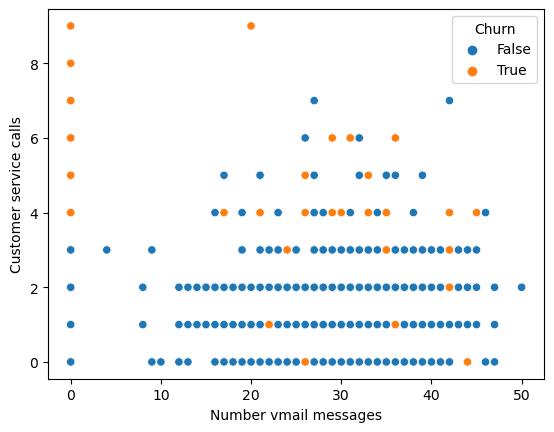

In [13]:
sns.scatterplot(x="Number vmail messages",y="Customer service calls",hue="Churn",data=df)

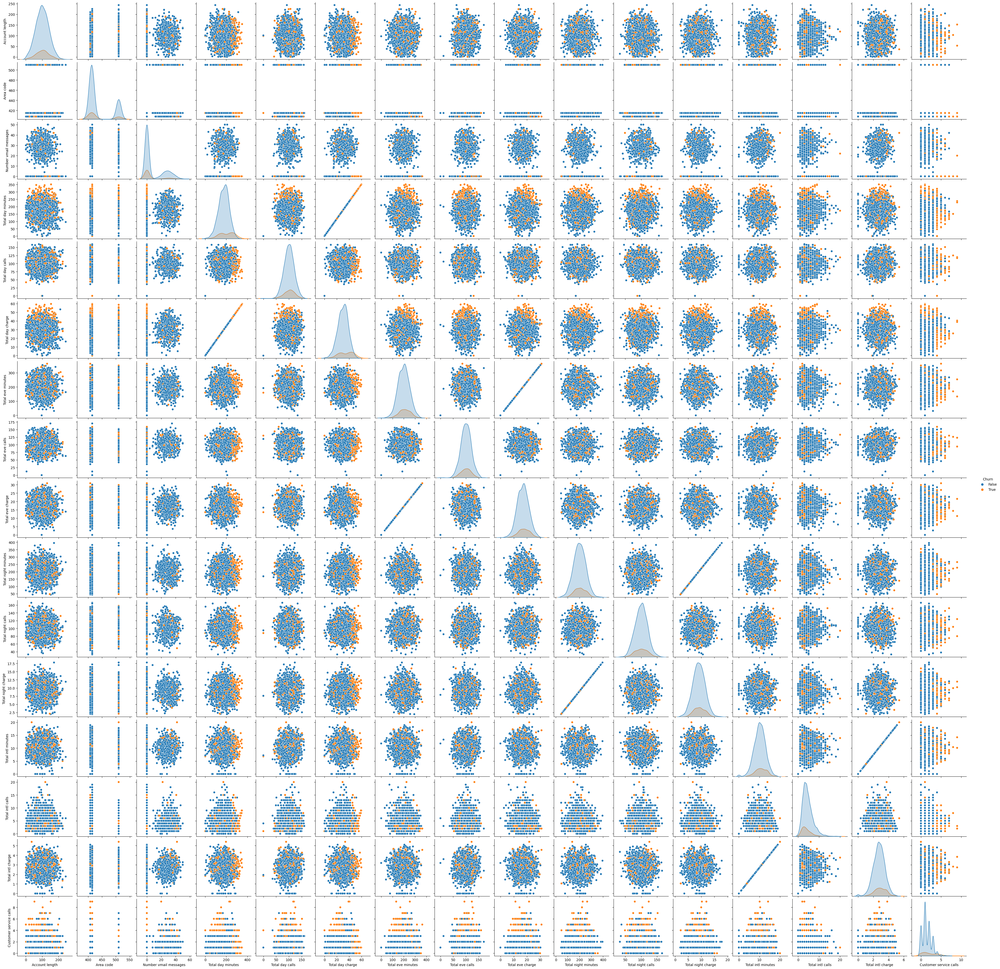

In [14]:
sns.pairplot(df,hue="Churn")

<AxesSubplot:>

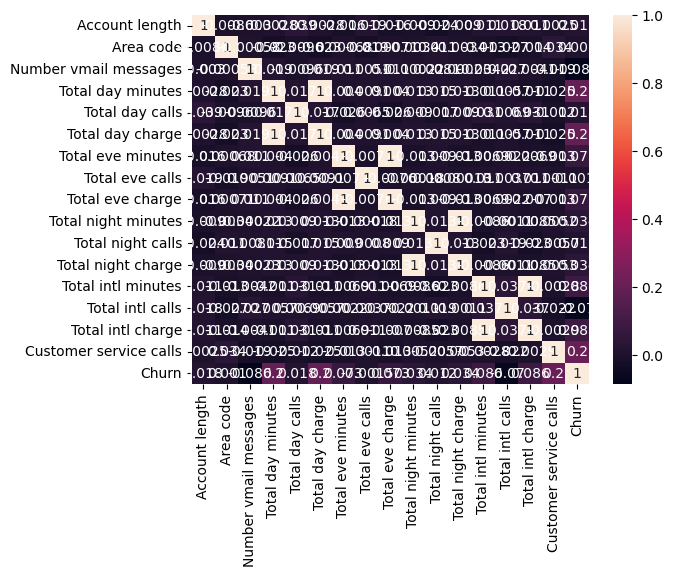

In [15]:
sns.heatmap(df.corr(),annot=True)

# x and y

In [16]:
x=pd.get_dummies(df.drop("Churn",axis=1),drop_first=True)
y=df["Churn"]

# Handling Imbalance Data

In [17]:
from imblearn.over_sampling import SMOTE
SMOTE=SMOTE()
x_new,y_new=SMOTE.fit_resample(x,y)
y_new.value_counts()

False    2278
True     2278
Name: Churn, dtype: int64

# TTS

In [18]:
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.3,random_state=101)

# Modelling with default parameters(Gradient Boost Classifier)

In [19]:
from sklearn.ensemble import GradientBoostingClassifier
model=GradientBoostingClassifier()
model.fit(x_train,y_train)
#prediction
ypredtrain=model.predict(x_train)
ypredtest=model.predict(x_test)
#evaluation
from sklearn.metrics import accuracy_score,plot_confusion_matrix,classification_report
print("Train score:",accuracy_score(y_train,ypredtrain))
print("Test score:",accuracy_score(y_test,ypredtest))

Train score: 0.9125117591721543
Test score: 0.8902706656912948


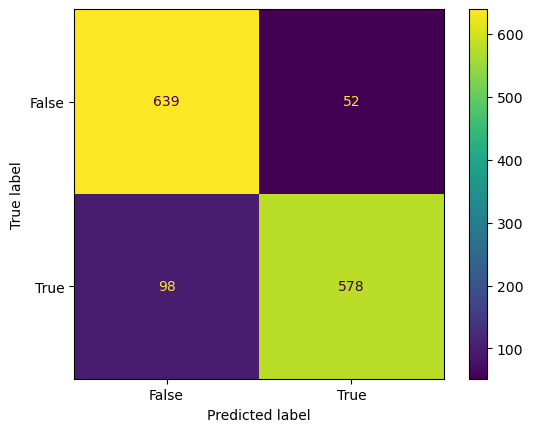

In [20]:
plot_confusion_matrix(model,x_test,y_test)

In [21]:
print(classification_report(y_test,ypredtest))

              precision    recall  f1-score   support

       False       0.87      0.92      0.89       691
        True       0.92      0.86      0.89       676

    accuracy                           0.89      1367
   macro avg       0.89      0.89      0.89      1367
weighted avg       0.89      0.89      0.89      1367



# Cross validation score

In [22]:
scores=cross_val_score(model,x_new,y_new,cv=5)
scores.mean()

0.8773203246865793

# HPT

In [23]:
estimator=GradientBoostingClassifier()
param_grid={"n_estimators":list(range(1,101))}
hpmodel=GridSearchCV(estimator,param_grid,cv=5,scoring="accuracy")
hpmodel.fit(x_train,y_train)
hpmodel.best_params_

{'n_estimators': 99}

# Final Model with best parameters

In [24]:
newmodel=GradientBoostingClassifier(n_estimators=92)
newmodel.fit(x_train,y_train)
ypredtrain=newmodel.predict(x_train)
ypredtest=newmodel.predict(x_test)
print("Train score:",accuracy_score(y_train,ypredtrain))
print("Test score:",accuracy_score(y_test,ypredtest))

Train score: 0.9109438695515836
Test score: 0.8902706656912948


# Feature Importance

In [25]:
model.feature_importances_
d=pd.DataFrame(index=x.columns,columns=["importance"],data=model.feature_importances_)
d

,importance
Account length,0.002093
Area code,0.077595
Number vmail messages,0.052374
Total day minutes,0.138625
Total day calls,0.007147
...,...
State_WI,0.002788
State_WV,0.006059
State_WY,0.002467
International plan_Yes,0.071516


In [26]:
dnew=d[d["importance"]>0.01]
dnew.sort_values("importance")

,importance
Total intl charge,0.015971
Total intl minutes,0.026603
Total eve minutes,0.027901
Total eve charge,0.028179
Number vmail messages,0.052374
Total intl calls,0.054900
International plan_Yes,0.071516
Area code,0.077595
Voice mail plan_Yes,0.096661
Total day minutes,0.138625


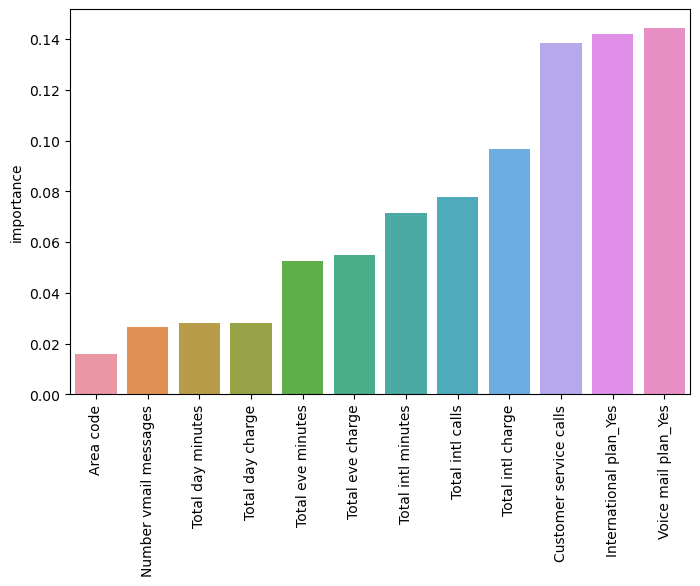

In [27]:
#Visulization plot
plt.figure(figsize=(8,5),dpi=100)
sns.barplot(x=dnew.index,y="importance",data=dnew.sort_values("importance"))
plt.xticks(rotation=90)
plt.show()